### Project Assignment 3: Analysis, Modeling, and Simulation

# Covid-19, Population Migration, & Electoral Outcomes

The Covid-19 pandemic reshaped population patterns across the United States, as millions of residents relocated from dense urban centers to suburban and rural communities. These demographic shifts have not only redefined the spatial distribution of people across the U.S., but may have also influenced the political landscape of the nation.

In this analysis, I examine changes in population density at the county level from April 2020 to July 2024 using official estimates from the [<b>U.S. Census Bureau</b>](https://www.census.gov/data/datasets/time-series/demo/popest/2020s-counties-total.html). Through the use of choropleth maps and datatables, I visualize percent change in population densities at the county and state levels, highlighting regions that experienced the most significant growth or decline.

To explore how these demographic movements may intersect with political realignment, I analyze county-level voting data from the 2020 and 2024 U.S. Presidential Elections, obtained from [<b>MIT's Election Data and Science Lab</b>](https://dataverse.harvard.edu/dataset.xhtml?persistentId=doi:10.7910/DVN/VOQCHQ). By comparing shifts in voter preferences with changes in population density, this study aims to identify potential correlations between post-pandemic migration trends and partisan outcomes - particularly within key swing states that often determine the overall election result.

Ultimately, this analysis seeks to provide a data-driven perspective on how population mobility in the wake of Covid-19 may have reshaped the political geography of the United States, revealing broader relationships between demographic change, density, and electoral behavior.

## Part 1: Covid-19 & Population Migration

In this section, I examine how population density changed across the United States between 2020 and 2024, highlighting the demographic shifts brought on by the Covid-19 pandemic. At the county level, I focus on percent changes in population density within key swing states to identify regions that experienced the most significant growth or decline. At the broader scale, I analyze state-level density changes for all 50 states to understand how these swing states compare nationally and whether similar migration patterns emerged across the country.

In [1]:
import pandas as pd
import numpy as np
import folium, requests
from branca.element import Element

In [2]:
# === Load population data ===
pop = pd.read_csv("2020_vs_2024_pop_density_by_county.csv")

# Clean columns
pop = pop.rename(columns={"County":"county_name","2020":"pop_2020","2024":"pop_2024"})
pop["county_name"] = pop["county_name"].str.strip().str.replace("^\.", "", regex=True)

# Split into county + state
pop[["county_part","state_full"]] = pop["county_name"].str.split(", ", n=1, expand=True)

# Map state full names → abbreviations
state_map = {
    'Alabama':'AL','Alaska':'AK','Arizona':'AZ','Arkansas':'AR','California':'CA','Colorado':'CO',
    'Connecticut':'CT','Delaware':'DE','District of Columbia':'DC','Florida':'FL','Georgia':'GA',
    'Hawaii':'HI','Idaho':'ID','Illinois':'IL','Indiana':'IN','Iowa':'IA','Kansas':'KS','Kentucky':'KY',
    'Louisiana':'LA','Maine':'ME','Maryland':'MD','Massachusetts':'MA','Michigan':'MI','Minnesota':'MN',
    'Mississippi':'MS','Missouri':'MO','Montana':'MT','Nebraska':'NE','Nevada':'NV','New Hampshire':'NH',
    'New Jersey':'NJ','New Mexico':'NM','New York':'NY','North Carolina':'NC','North Dakota':'ND',
    'Ohio':'OH','Oklahoma':'OK','Oregon':'OR','Pennsylvania':'PA','Rhode Island':'RI',
    'South Carolina':'SC','South Dakota':'SD','Tennessee':'TN','Texas':'TX','Utah':'UT','Vermont':'VT',
    'Virginia':'VA','Washington':'WA','West Virginia':'WV','Wisconsin':'WI','Wyoming':'WY'
}
pop["state_abbr"] = pop["state_full"].map(state_map)

# Clean county names
pop["county_name_clean"] = (
    pop["county_part"]
    .str.replace(" County","",regex=False)
    .str.replace(" Parish","",regex=False)
    .str.replace(" Borough","",regex=False)
    .str.replace(" Census Area","",regex=False)
    .str.strip()
    + ", " + pop["state_abbr"]
)

# Convert pop columns to numeric
pop["pop_2020"] = pd.to_numeric(pop["pop_2020"].replace(",","",regex=True), errors="coerce")
pop["pop_2024"] = pd.to_numeric(pop["pop_2024"].replace(",","",regex=True), errors="coerce")


In [3]:
# FIPS reference
fips = pd.read_csv("https://raw.githubusercontent.com/kjhealy/fips-codes/master/state_and_county_fips_master.csv")
fips["county_name_clean"] = (
    fips["name"]
    .str.replace(" County","",regex=False)
    .str.replace(" Parish","",regex=False)
    .str.replace(" Borough","",regex=False)
    .str.replace(" Census Area","",regex=False)
    .str.strip()
    + ", " + fips["state"]
)
fips["county_fips"] = fips["fips"].astype(str).str.zfill(5)

merged = pop.merge(fips[["county_name_clean","county_fips"]], on="county_name_clean", how="left")

# Land area (from your uploaded GEOINFO2023.GEOINFO-Data.csv)
area = pd.read_csv("GEOINFO2023.GEOINFO-Data.csv", dtype=str)
area["county_fips"] = area["GEO_ID"].str[-5:]
area["land_area_sqmi"] = pd.to_numeric(area["AREALAND_SQMI"], errors="coerce")

merged = merged.merge(area[["county_fips","land_area_sqmi"]], on="county_fips", how="left")

# Compute true densities and % change
merged["pop_density_2020_true"] = merged["pop_2020"] / merged["land_area_sqmi"]
merged["pop_density_2024_true"] = merged["pop_2024"] / merged["land_area_sqmi"]
merged["density_change_pct"] = (
    (merged["pop_density_2024_true"] - merged["pop_density_2020_true"])
    / merged["pop_density_2020_true"]
) * 100


In [4]:
elec = pd.read_csv("county_election_results_2020_2024.csv")
elec = elec[elec["office"] == "US PRESIDENT"].copy()

def rep_share(df, year):
    d = df[df["year"] == year]
    pivot = d.pivot_table(index="county_fips", columns="party", values="candidatevotes", aggfunc="sum", fill_value=0).reset_index()
    pivot["rep_share_" + str(year)] = pivot.get("REPUBLICAN", 0) / (pivot.get("REPUBLICAN", 0) + pivot.get("DEMOCRAT", 0))
    pivot["county_fips"] = pivot["county_fips"].astype(str).str.strip().apply(lambda x: str(int(float(x))).zfill(5))
    return pivot[["county_fips","rep_share_" + str(year)]]

rep2020 = rep_share(elec, 2020)
rep2024 = rep_share(elec, 2024)

vote = rep2020.merge(rep2024, on="county_fips", how="inner")
vote["vote_shift_pct"] = (vote["rep_share_2024"] - vote["rep_share_2020"]) * 100

In [5]:
merged_all = merged.merge(vote, on="county_fips", how="inner")

swing_states = ['AZ','GA','MI','NV','NC','PA','WI']
merged_all = merged_all[merged_all["state_abbr"].isin(swing_states)].copy()

In [6]:
import numpy as np
import folium
import requests
import branca

# --- Load county boundaries (if not already loaded) ---
geojson_url = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
counties_geojson = requests.get(geojson_url).json()

# --- Column to map ---
col = "density_change_pct"

# --- Symmetric range around 0 so 0 is the split ---
max_abs = float(np.nanmax(np.abs(merged_all[col])))
vmin, vmax = -max_abs, max_abs

# --- Custom red–white–green colormap (no yellow/orange), centered at 0 ---
cmap = branca.colormap.LinearColormap(
    colors=["red", "white", "green"],
    vmin=vmin, vmax=vmax
)
cmap.caption = "% Change in Population Density (2020→2024)"  # legend title

# --- Value lookups for styling & tooltip ---
name_map = merged_all.set_index("county_fips")["county_name"].to_dict()
val_map = merged_all.set_index("county_fips")[col].to_dict()

# --- Make map ---
m_density = folium.Map(location=[37.8, -96], zoom_start=4, tiles="cartodbpositron")

# --- GeoJson layer with custom color per feature ---
def style_fn(feature):
    fips = feature["id"]
    v = val_map.get(fips, None)
    if v is None or (isinstance(v, float) and np.isnan(v)):
        return {"fillColor": "lightgrey", "color": "black", "weight": 0.2, "fillOpacity": 0.6}
    return {"fillColor": cmap(v), "color": "black", "weight": 0.2, "fillOpacity": 0.8}

# Add tooltip fields to features
for f in counties_geojson["features"]:
    fips = f["id"]
    f["properties"]["county_name"] = name_map.get(fips, "Unknown")
    v = val_map.get(fips)
    f["properties"]["density_chg"] = "No data" if v is None or (isinstance(v, float) and np.isnan(v)) else f"{v:+.1f}%"

gj = folium.GeoJson(
    counties_geojson,
    style_function=style_fn,
    tooltip=folium.GeoJsonTooltip(
        fields=["county_name","density_chg"],
        aliases=["County","Δ Density (%)"],
        localize=True,
    ),
    name="Population Density Change (2020–2024)"
).add_to(m_density)

# --- Title ---
title_html = """
    <h3 align="center" style="font-size:20px;font-weight:bold;margin-top:10px">
    Swing States — % Change in Population Density (2020–2024)
    </h3>
"""
m_density.get_root().html.add_child(folium.Element(title_html))

# --- Legend ---
cmap.add_to(m_density)

# --- Display & save ---
display(m_density)
m_density.save("swing_states_density_change.html")


#### Swing State Change in Population Density (2020–2024), County Level

Each **shape** represents a **county**. The **colors** show how **population density changed** from 2020 to 2024 within the swing states — green counties became more densely populated, while red counties saw declines in density. Darker shades indicate a stronger change. This helps highlight where population growth or loss was most concentrated across key battleground states.

In [7]:
# --- Start from full merged dataset, not swing-state filtered one ---
# (If you still have 'merged' in memory, use it directly)
df_all = merged.copy()

# --- Compute total population & land area per state ---
state_density_all = (
    df_all.groupby("state_abbr")
    .agg({
        "pop_2020": "sum",
        "pop_2024": "sum",
        "land_area_sqmi": "sum"
    })
    .reset_index()
)

# --- Compute 2020 & 2024 population density ---
state_density_all["density_2020"] = state_density_all["pop_2020"] / state_density_all["land_area_sqmi"]
state_density_all["density_2024"] = state_density_all["pop_2024"] / state_density_all["land_area_sqmi"]

# --- Compute % change ---
state_density_all["density_change_pct"] = (
    (state_density_all["density_2024"] - state_density_all["density_2020"])
    / state_density_all["density_2020"]
) * 100

# --- Sort descending by change ---
state_density_all = state_density_all.sort_values("density_change_pct", ascending=False).reset_index(drop=True)

# --- Add rank & clean up output ---
state_density_all["Rank"] = state_density_all.index + 1
state_density_all = state_density_all[["Rank", "state_abbr", "density_change_pct"]]

# --- Print nicely formatted list ---
pd.set_option("display.float_format", lambda x: f"{x:.2f}%")
print(state_density_all.to_string(index=False))

 Rank state_abbr  density_change_pct
    1         ID               8.83%
    2         FL               8.52%
    3         TX               7.35%
    4         UT               7.09%
    5         SC               7.04%
    6         DE               6.26%
    7         AZ               5.93%
    8         NC               5.79%
    9         NV               5.21%
   10         MT               4.89%
   11         TN               4.56%
   12         GA               4.36%
   13         SD               4.28%
   14         OK               3.43%
   15         WA               3.25%
   16         CO               3.15%
   17         ME               3.07%
   18         AL               2.63%
   19         AR               2.55%
   20         NH               2.29%
   21         NJ               2.28%
   22         ND               2.25%
   23         NE               2.22%
   24         VA               2.08%
   25         IN               2.03%
   26         WY               1.87%
 

#### National Change in Population Density (2020–2024), State Level

This table ranks all 50 states by their percent change in population density from 2020 to 2024. States near the top experienced the fastest growth, meaning their populations increased relative to land area, while those near the bottom saw little growth or declines in density. In other words, it shows which states experienced the fastest population growth and which saw slower or declining density after the Covid-19 pandemic.

When looking at our swing states, we can see they ranked as following:  
7. AZ  
8. NC  
9. NV  
12. GA  
35. WI  
41. MI  
43. PA  

The majority of swing states ranked in the upper half, indicating stronger population growth between 2020 and 2024 nationally. States like Arizona, North Carolina, Nevada, and Georgia all experienced some of the highest increases in density, reflecting continued in-migration and expansion in key Sun Belt regions. In contrast, Wisconsin, Michigan, and Pennsylvania ranked lower, showing slower growth consistent with broader population stagnation in parts of the Midwest and Northeast.

Having explored patterns of population growth and migration, we next will analyze changes in partisan voting between 2020 and 2024.

## Part 2: Electoral Shifts and Voting Patterns

This section explores how voting behavior evolved between the 2020 and 2024 U.S. Presidential Elections, with a focus on changes in Republican vote share at both the county and state level within key swing states. By quantifying percent change in vote share, this analysis highlights where partisan support strengthened or weakened over time. Examining these shifts alongside population changes offers insight into how demographic movement may have intersected with political realignment across pivotal regions of the country.

In [8]:
# --- Column and symmetric color bins ---
col = "vote_shift_pct"
max_abs = np.nanmax(np.abs(merged_all[col]))
qbins = np.linspace(-max_abs, max_abs, 7)  # Symmetric bins centered on 0

# --- Create map ---
m_vote = folium.Map(location=[37.8, -96], zoom_start=4, tiles="cartodbpositron")

# --- Choropleth layer ---
folium.Choropleth(
    geo_data=counties_geojson,
    name="Republican Vote Share Change (2020–2024)",
    data=merged_all,
    columns=["county_fips", col],
    key_on="feature.id",
    fill_color="RdBu_r",  # Red = GOP gain, Blue = Dem gain
    fill_opacity=0.8,
    line_opacity=0.2,
    bins=qbins,  # Symmetric bins ensure 0 is midpoint
    nan_fill_color="lightgrey",
    legend_name="Change in Republican Vote Share (p.p.) 2020→2024",
).add_to(m_vote)

# --- Tooltip setup ---
name_map = merged_all.set_index("county_fips")["county_name"].to_dict()
val_map = merged_all.set_index("county_fips")[col].round(1).to_dict()
for f in counties_geojson["features"]:
    fips = f["id"]
    f["properties"]["county_name"] = name_map.get(fips, "Unknown")
    v = val_map.get(fips)
    f["properties"]["vote_shift"] = "No data" if v is None or np.isnan(v) else f"{v:+.1f} p.p."

folium.GeoJson(
    counties_geojson,
    style_function=lambda x: {"fillOpacity": 0, "weight": 0},
    tooltip=folium.GeoJsonTooltip(
        fields=["county_name", "vote_shift"],
        aliases=["County", "Δ Republican Share (p.p.)"],
        localize=True,
    ),
).add_to(m_vote)

# --- Add title ---
title_html = """
    <h3 align="center" style="font-size:20px;font-weight:bold;margin-top:10px">
    Swing States — Change in Republican Vote Share (2020–2024)
    </h3>
"""
m_vote.get_root().html.add_child(folium.Element(title_html))

# --- Display and save map ---
display(m_vote)
m_vote.save("swing_states_vote_shift.html")


#### Swing State Change in Republican Vote Share (2020–2024), County Level

Each **shape** represents a **county**. The **colors** show how the **Republican vote share changed** between the 2020 and 2024 presidential elections within the swing states - red counties saw an increase in Republican vote share, while blue counties shifted more Democratic. Darker shades indicate a stronger change. This helps visualize where Republican support grew or declined across key battleground states.

Overall, the map shows strikingly more red than blue, meaning that a larger share of swing-state counties experienced an increase in Republican vote share from 2020 to 2024. This suggests that Republican momentum was widespread, even if the intensity of the shift varied by region.

In [9]:
# --- Create state-level average vote shift ---
state_vote_shift = (
    merged_all.groupby("state_abbr")["vote_shift_pct"]
    .mean()
    .reset_index()
    .sort_values("vote_shift_pct", ascending=False)
)

# --- Display all states ranked ---
print("\nAverage Change in Republican Vote Share (2020→2024) by State")
print(state_vote_shift.to_string(index=False))


Average Change in Republican Vote Share (2020→2024) by State
state_abbr  vote_shift_pct
        AZ           4.38%
        GA           1.45%
        NC           1.25%
        WI           1.20%
        MI           1.18%
        NV           1.13%
        PA           0.86%


#### Swing State Change in Republican Vote Share (2020–2024), State Level

This table shows the **average change in Republican vote share** between the 2020 and 2024 presidential elections for **each swing state**. All seven states saw Republican gains, with Arizona (+4.38%) showing the largest increase and Pennsylvania (+0.86%) the smallest. Overall, the data suggests a consistent Republican uptick across the battlegrounds, with particularly strong momentum in the Sun Belt states (Arizona, Georgia, and North Carolina). **Recall that these same Sun Belt states also experienced the highest increases in population density.**

This connection between population increases and Republican gains raises an important question: **to what extent might migration itself have influenced these electoral shifts?** The next section explores this relationship directly by examining the correlation between population density change and partisan vote share, revealing how demographic movement may have shaped the broader red wave of 2024.

## Part 3: Linking Population Shifts and Political Change

This section investigates the relationship between population movement and partisan voting outcomes. By analyzing the correlation between county-level changes in population density (2020–2024) and shifts in Republican vote share over the same period, this analysis explores whether migration trends during and after the Covid-19 pandemic may be associated with political realignment in key regions. The goal is to identify whether counties that gained or lost population tended to show corresponding changes in partisan support, revealing how demographic and political dynamics may intersect across the post-pandemic landscape.

In [10]:
from IPython.display import HTML

# First, make sure both maps were saved:
#   swing_states_density_change.html
#   swing_states_vote_shift.html

# Combine them side-by-side in one HTML layout
html = """
<div style="display:flex; justify-content:center; gap:20px;">
  <iframe src="swing_states_density_change.html" width="49%" height="600px" style="border:1px solid #ccc;"></iframe>
  <iframe src="swing_states_vote_shift.html" width="49%" height="600px" style="border:1px solid #ccc;"></iframe>
</div>
"""

# Display inside Jupyter
display(HTML(html))

# (Optional) Save combined HTML file
with open("combined_maps.html", "w") as f:
    f.write(html)


#### Swing State Change in Population Density vs Change in Republican Vote Share (2020–2024), County Level

Our two maps are shown side by side to compare population density change (left) and Republican vote share change (right) from 2020 to 2024.

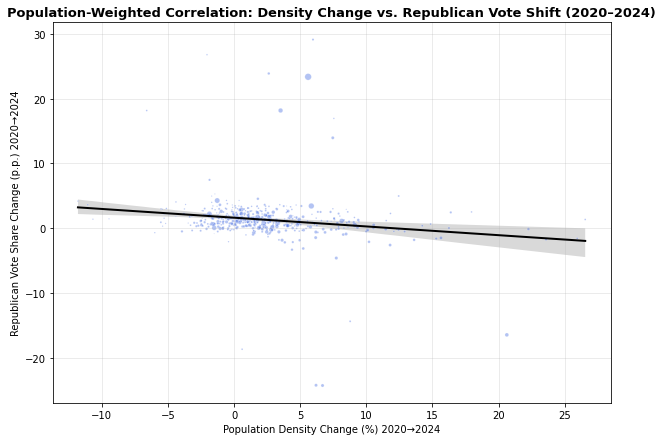

Weighted Pearson correlation (population-weighted): -0.021


In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- Filter for valid numeric data ---
corr_df = merged_all.dropna(subset=["density_change_pct", "vote_shift_pct", "pop_density_2024_true", "land_area_sqmi"])

# --- Approximate 2024 population (density × land area) ---
corr_df["population_2024"] = corr_df["pop_density_2024_true"] * corr_df["land_area_sqmi"]

# --- Scale bubble sizes for visibility ---
corr_df["bubble_size"] = np.sqrt(corr_df["population_2024"]) / 50  # tweak divisor to adjust bubble size

plt.figure(figsize=(10,7))

# --- Add regression line (unweighted trend) ---
sns.regplot(
    data=corr_df,
    x="density_change_pct",
    y="vote_shift_pct",
    scatter=False,
    line_kws={"color":"black","lw":2}
)

# --- Add weighted bubbles ---
plt.scatter(
    corr_df["density_change_pct"],
    corr_df["vote_shift_pct"],
    s=corr_df["bubble_size"],
    alpha=0.4,
    color="royalblue",
    edgecolor="white",
    linewidth=0.5
)

plt.title("Population-Weighted Correlation: Density Change vs. Republican Vote Shift (2020–2024)",
          fontsize=13, fontweight="bold")
plt.xlabel("Population Density Change (%) 2020→2024")
plt.ylabel("Republican Vote Share Change (p.p.) 2020→2024")
plt.grid(alpha=0.3)
plt.show()

# --- Manual population-weighted correlation ---
x = corr_df["density_change_pct"]
y = corr_df["vote_shift_pct"]
w = corr_df["population_2024"]

# Weighted means
x_mean = np.average(x, weights=w)
y_mean = np.average(y, weights=w)

# Weighted covariance & variances
cov_xy = np.average((x - x_mean) * (y - y_mean), weights=w)
var_x = np.average((x - x_mean)**2, weights=w)
var_y = np.average((y - y_mean)**2, weights=w)

weighted_corr = cov_xy / np.sqrt(var_x * var_y)

print(f"Weighted Pearson correlation (population-weighted): {weighted_corr:.3f}")


#### Swing State Population-Weighted Correlation: Density Change vs. Republican Vote Shift (2020-2024), County Level

Each **dot** represents a **county** within the swing states, positioned by its percent change in population density (x-axis) and change in Republican vote share (y-axis) between 2020 and 2024. The **size** of each dot corresponds to the county’s **population**, giving greater visual weight to areas with more residents. The **black regression line** represents the **overall population-weighted trend**, showing a slight negative slope that indicates a **weak inverse relationship** (r = -0.02) between population growth and Republican vote gains.

This suggests that, weakly, counties experiencing the fastest population growth generally leaned more Democratic. However, when viewing the data at this aggregate level, **several larger, high-population counties stand out as clear outliers, showing both strong population growth and increases in Republican vote share**. These high-impact counties visually pulled in the opposite direction of the broader trend, **hinting that population size might be an important factor in understanding the true dynamics beneath the surface**. This observation prompted a deeper analysis separating counties that trended Republican from those that trended Democratic, revealing that the largest and most influential counties were indeed driving much of the Republican momentum in 2024 despite the overall negative correlation, as we explore below.

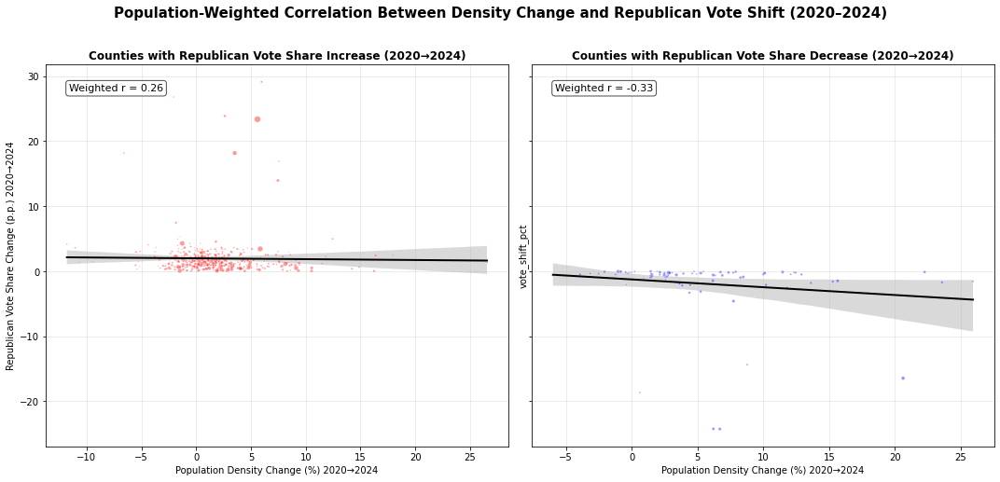

Weighted correlation (Rep gain counties):  0.262
Weighted correlation (Rep loss counties): -0.328


In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- Filter for valid numeric data ---
corr_df = merged_all.dropna(subset=["density_change_pct", "vote_shift_pct", "pop_density_2024_true", "land_area_sqmi"])

# --- Approximate 2024 population (density × land area) ---
corr_df["population_2024"] = corr_df["pop_density_2024_true"] * corr_df["land_area_sqmi"]

# --- Scale bubble sizes for visibility ---
corr_df["bubble_size"] = np.sqrt(corr_df["population_2024"]) / 50  # tweak divisor for bubble scaling

# --- Split into Republican gain vs. loss counties ---
rep_gain = corr_df[corr_df["vote_shift_pct"] > 0]
rep_loss = corr_df[corr_df["vote_shift_pct"] <= 0]

# --- Create figure with two subplots ---
fig, axes = plt.subplots(1, 2, figsize=(15,7), sharey=True)

# --- Function for weighted correlation ---
def weighted_corr(x, y, w):
    x_mean = np.average(x, weights=w)
    y_mean = np.average(y, weights=w)
    cov_xy = np.average((x - x_mean) * (y - y_mean), weights=w)
    var_x = np.average((x - x_mean)**2, weights=w)
    var_y = np.average((y - y_mean)**2, weights=w)
    return cov_xy / np.sqrt(var_x * var_y)

# --- Plot: Republican gains ---
sns.regplot(
    data=rep_gain,
    x="density_change_pct",
    y="vote_shift_pct",
    scatter=False,
    line_kws={"color":"black","lw":2},
    ax=axes[0]
)

axes[0].scatter(
    rep_gain["density_change_pct"],
    rep_gain["vote_shift_pct"],
    s=rep_gain["bubble_size"],
    alpha=0.4,
    color="red",
    edgecolor="white",
    linewidth=0.5
)

r_gain_weighted = weighted_corr(
    rep_gain["density_change_pct"], 
    rep_gain["vote_shift_pct"], 
    rep_gain["population_2024"]
)

axes[0].set_title("Counties with Republican Vote Share Increase (2020→2024)", fontsize=12, fontweight='bold')
axes[0].set_xlabel("Population Density Change (%) 2020→2024")
axes[0].set_ylabel("Republican Vote Share Change (p.p.) 2020→2024")
axes[0].text(0.05, 0.95, f"Weighted r = {r_gain_weighted:.2f}", transform=axes[0].transAxes,
             fontsize=11, verticalalignment='top', bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.7))
axes[0].grid(alpha=0.3)

# --- Plot: Republican losses ---
sns.regplot(
    data=rep_loss,
    x="density_change_pct",
    y="vote_shift_pct",
    scatter=False,
    line_kws={"color":"black","lw":2},
    ax=axes[1]
)

axes[1].scatter(
    rep_loss["density_change_pct"],
    rep_loss["vote_shift_pct"],
    s=rep_loss["bubble_size"],
    alpha=0.4,
    color="blue",
    edgecolor="white",
    linewidth=0.5
)

r_loss_weighted = weighted_corr(
    rep_loss["density_change_pct"], 
    rep_loss["vote_shift_pct"], 
    rep_loss["population_2024"]
)

axes[1].set_title("Counties with Republican Vote Share Decrease (2020→2024)", fontsize=12, fontweight='bold')
axes[1].set_xlabel("Population Density Change (%) 2020→2024")
axes[1].text(0.05, 0.95, f"Weighted r = {r_loss_weighted:.2f}", transform=axes[1].transAxes,
             fontsize=11, verticalalignment='top', bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.7))
axes[1].grid(alpha=0.3)

# --- Layout ---
plt.suptitle("Population-Weighted Correlation Between Density Change and Republican Vote Shift (2020–2024)",
             fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

print(f"Weighted correlation (Rep gain counties):  {r_gain_weighted:.3f}")
print(f"Weighted correlation (Rep loss counties): {r_loss_weighted:.3f}")


#### Swing State Population-Weighted Correlation: Density Change vs. Republican Vote Shift Breakout (2020-2024), County Level

The population-weighted analysis reveals a compelling relationship between demographic change and partisan voting patterns. **When separating counties that increased vs. decreased in Republican vote share, the data more strongly supports the idea that migration and vote share are correlated.** The largest and most populous counties (those carrying the most electoral influence) were concentrated among areas that **increased in Republican vote share** between 2020 and 2024, showing a **modest positive correlation** (r = +0.26) between population density growth and Republican gains. This indicates that population growth post-Covid in key suburban and exurban regions helped strengthen Republican performance in 2024. Meanwhile, smaller **counties that trended Democratic showed a moderate negative correlation** (r = –0.33), but their overall impact was limited due to their lower population weight. 

Together, these results suggest that growth in larger, fast-expanding counties played a significant role in shaping the broader red momentum of the 2024 election, as high-population regions leaned more Republican while smaller, less populous areas shifted modestly blue.

Pearson correlation between density change and Republican vote shift: 0.513


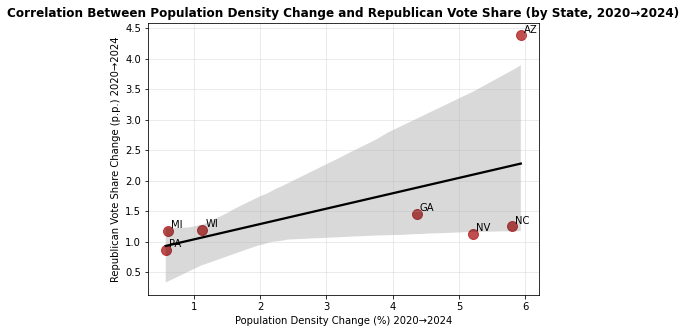

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Create DataFrame combining population density change + vote shift ---
data = {
    "state_abbr": ["AZ", "GA", "NC", "WI", "MI", "NV", "PA"],
    "vote_shift_pct": [4.38, 1.45, 1.25, 1.20, 1.18, 1.13, 0.86],
    "density_change_pct": [5.93, 4.36, 5.79, 1.13, 0.61, 5.21, 0.58]
}

df_corr = pd.DataFrame(data)

# --- Calculate correlation ---
corr = df_corr["vote_shift_pct"].corr(df_corr["density_change_pct"])
print(f"Pearson correlation between density change and Republican vote shift: {corr:.3f}")

# --- Plot ---
plt.figure(figsize=(7,5))
sns.regplot(
    data=df_corr,
    x="density_change_pct",
    y="vote_shift_pct",
    color="firebrick",
    scatter_kws={"s":100, "alpha":0.8},
    line_kws={"color":"black"}
)
for i, row in df_corr.iterrows():
    plt.text(row["density_change_pct"]+0.05, row["vote_shift_pct"]+0.05, row["state_abbr"], fontsize=10)

plt.title("Correlation Between Population Density Change and Republican Vote Share (by State, 2020→2024)", fontsize=12, fontweight="bold")
plt.xlabel("Population Density Change (%) 2020→2024")
plt.ylabel("Republican Vote Share Change (p.p.) 2020→2024")
plt.grid(alpha=0.3)
plt.show()


#### Swing State Population-Weighted Correlation: Density Change vs. Republican Vote Shift (2020-2024), State Level

To conclude our analysis, we take a **high-level** look at the **correlation between population migration and partisan change**, tying back to our earlier state-level findings on population density growth and Republican vote share increases. At this broader view, we find a **moderate positive relationship** (r = 0.51), indicating that states with faster population growth also tended to experience larger Republican gains between 2020 and 2024. This reinforces the trends observed throughout the county- and population-weighted analyses, suggesting that post-Covid migration and expansion into high-growth regions may have played a pivotal role in shaping the 2024 election, linking demographic movement and political realignment on both local and statewide scales.

## Conclusion

The analysis reveals a compelling connection between post-Covid population migration and shifting political outcomes across the United States, particularly within key swing states. Between 2020 and 2024, many of the fastest-growing counties experienced both increases in population density and gains in Republican vote share. Meanwhile, slower-growing or declining regions showed smaller or negative Republican shifts. This suggests that migration patterns may have played a pivotal role in shaping the electoral landscape. 

When accounting for county population size, the trend becomes even clearer - larger, high-growth counties tended to lean more Republican, amplifying their influence on statewide results. 

Together, these findings suggest that post-pandemic migration not only reshaped the geographic arrangement of Americans across the country but also may have played a pivotal role in how they voted, contributing to the broader Republican surge observed in the 2024 election.

## Data Sources

* [<b>U.S. Census Bureau County Population Totals</b>](https://www.census.gov/data/datasets/time-series/demo/popest/2020s-counties-total.html) to track population inflows and outflows between 2020 and 2024
* [<b>USDA Rural-Urban Continuum Codes</b>](https://www.ers.usda.gov/data-products/rural-urban-continuum-codes) to classify counties into metropolitan and non-metropolitan categories
* [<b>U.S. Census Bureau Geography Information (GEOINFO)</b>](https://data.census.gov/table?q=GEOINFO&g=010XX00US$0500000&d=GEO+Geography+Information) to obtain county-level land area measurements used in calculating population density
* [<b>MIT Election Data and Science Lab County Presidential Election Returns</b>](https://dataverse.harvard.edu/dataset.xhtml?persistentId=doi:10.7910/DVN/VOQCHQ) to analyze voting results for 2020 and 2024